In [1]:
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch
from torch import optim
import random
import time
from utils import load_1d_data
from utils import load_2d_data
from utils import draw
from utils import table_draw


In [2]:
class Simple_Generator(nn.Module):
    def __init__(self):
        super(Simple_Generator, self).__init__()
        
        # define hidden linear layers
        self.fc1 = nn.Linear(100, 32)
        self.fc2 = nn.Linear(32, 64)
        self.fc3 = nn.Linear(64, 128)
        
        # final fully-connected layer
        self.fc4 = nn.Linear(128, 28 * 28)
        
        # dropout layer
        self.dropout = nn.Dropout(0.3)

        self.criterion = nn.BCEWithLogitsLoss()

        return

    def forward(self, x):
        # all hidden layers
        x = F.leaky_relu(self.fc1(x), 0.2)  # (input, negative_slope=0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = self.dropout(x)
        # final layer with tanh applied
        out = F.tanh(self.fc4(x))

        return out

class Simple_Discriminator(nn.Module):
    def __init__(self):
        super(Simple_Discriminator, self).__init__()
        
        # define hidden linear layers
        self.fc1 = nn.Linear(784, 32 * 4)
        self.fc2 = nn.Linear(32 * 4, 32 * 2)
        self.fc3 = nn.Linear(32 * 2, 32)
        
        # final fully-connected layer
        self.fc4 = nn.Linear(32, 1)
        
        # dropout layer
        self.dropout = nn.Dropout(0.3)

        self.criterion = nn.BCEWithLogitsLoss()

        return
        
    def forward(self, x):
        # flatten image
        x = x.view(-1, 28 * 28)
        # all hidden layers
        x = F.leaky_relu(self.fc1(x), 0.2)  # (input, negative_slope=0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = self.dropout(x)
        # final layer
        out = self.fc4(x)

        return out

class Simple_GAN(nn.Module):
    def __init__(self):
        super(Simple_GAN, self).__init__()
        self.generator = Simple_Generator()
        self.discriminator = Simple_Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 100, device=(self.device)) * 2 - 1

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.reshape(-1, 28 * 28).to(self.device) * 2 - 1
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, 1), torch.ones(batch_size, 1)), 0)
        labels = labels.to(self.device)
        fake_labels = torch.ones(batch_size, 1).to(self.device)

        g_optimizer = optim.Adam(self.generator.parameters(), lr=g_eta)
        d_optimizer = optim.Adam(self.discriminator.parameters(), lr=d_eta)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.generator.criterion(d_out, fake_labels)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices].squeeze()
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True and epoch % 10 == 0:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))



In [3]:
class CNN_Generator(nn.Module):
    def __init__(self):
        super(CNN_Generator, self).__init__()
        # The decoder
        self.t_conv1 = nn.ConvTranspose2d(1, 16, 2, stride=2, bias=False)
        # self.bn1 = nn.BatchNorm2d(16)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2, bias=False)
        # self.bn2 = nn.BatchNorm2d(1)

        return

    def forward(self, x):
        x = F.leaky_relu(self.t_conv1(x))
        x = F.sigmoid(self.t_conv2(x))

        return x

class CNN_Discriminator(nn.Module):
    def __init__(self):
        super(CNN_Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(1, 64, 3, stride=(3, 3))
        # self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 16, 3, stride=(3, 3))
        # self.bn2 = nn.BatchNorm2d(16)

        # self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(16 * 3 * 3, 120)
        self.fc2 = nn.Linear(120, 32)
        self.fc3 = nn.Linear(32, 1)

        # self.sm = nn.Softmax()

        # self.criterion = nn.NLLLoss()
        self.criterion = nn.BCELoss()

        return

    def forward(self, x):
        # Let the net to learn pool function
        # x = self.pool(F.leaky_relu(self.conv1(x)))

        # x = self.pool(F.leaky_relu(self.conv2(x)))

        x = x.reshape(-1, 1, 28, 28)

        x = F.leaky_relu(self.conv1(x))
        # x = F.leaky_relu(x)
        x = F.leaky_relu(self.conv2(x))
        # x = F.leaky_relu(x)

        x = x.view(-1, self.num_flat_features(x))   # -1 represents the batch dimension
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = F.sigmoid(self.fc3(x))
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

class CNN_GAN(nn.Module):
    def __init__(self):
        super(CNN_GAN, self).__init__()
        self.generator = CNN_Generator()
        self.discriminator = CNN_Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 1, 7, 7, device=(self.device))

    def g_loss(self, d_out):
        loss = torch.mean(torch.log(1 - d_out))

        return loss

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.to(self.device)
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, 1), torch.ones(batch_size, 1)), 0)
        labels = labels.to(self.device)
        fake_labels = torch.ones(batch_size, 1).to(self.device)

        g_optimizer = optim.Adam(self.generator.parameters(), lr=g_eta)
        d_optimizer = optim.Adam(self.discriminator.parameters(), lr=d_eta)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.g_loss(d_out)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices]
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True and epoch % 10 == 0:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))


In [4]:
train_set, train_label, valid_set, valid_label, test_set, test_label = load_2d_data(50000, 0, 0)


In [5]:
net = Simple_GAN()


trainning on cuda:0
epoch 0 finished!
time usage: 2.277279853820801
epoch 1 finished!
time usage: 2.103350877761841
epoch 2 finished!
time usage: 2.106461524963379
epoch 3 finished!
time usage: 2.105536937713623
epoch 4 finished!
time usage: 2.0427756309509277
epoch 5 finished!
time usage: 2.0802810192108154
epoch 6 finished!
time usage: 2.1143360137939453
epoch 7 finished!
time usage: 2.1148955821990967
epoch 8 finished!
time usage: 2.1025238037109375
epoch 9 finished!
time usage: 2.068953514099121
epoch 10 finished!
time usage: 2.0925564765930176
epoch 11 finished!
time usage: 2.040902853012085
epoch 12 finished!
time usage: 2.1348235607147217
epoch 13 finished!
time usage: 2.1089236736297607
epoch 14 finished!
time usage: 2.1331238746643066
epoch 15 finished!
time usage: 2.1339409351348877
epoch 16 finished!
time usage: 2.124075412750244
epoch 17 finished!
time usage: 2.131913900375366
epoch 18 finished!
time usage: 2.1347861289978027
epoch 19 finished!
time usage: 2.092311859130859

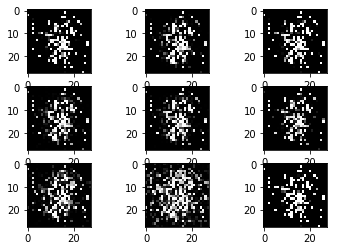

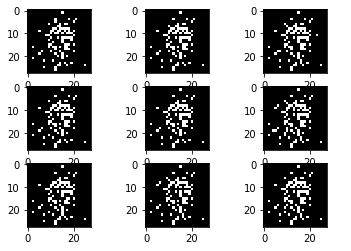

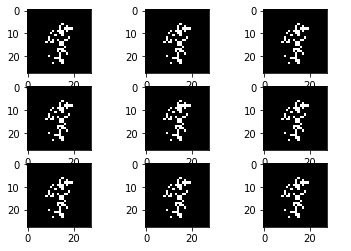

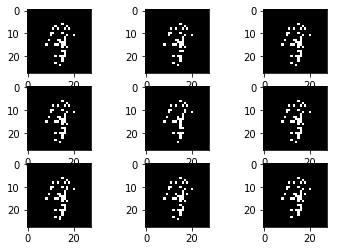

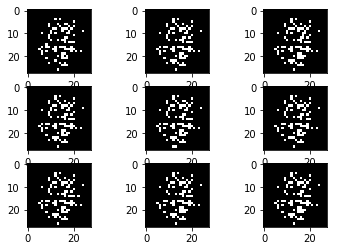

...

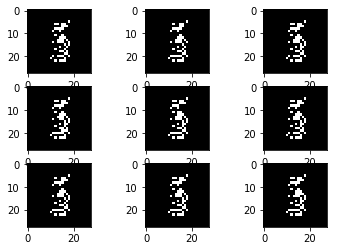

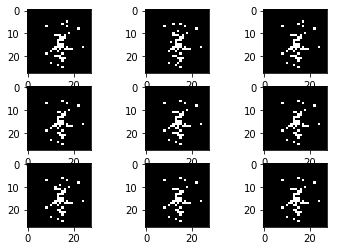

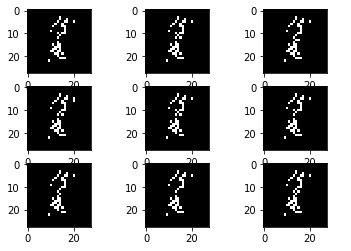

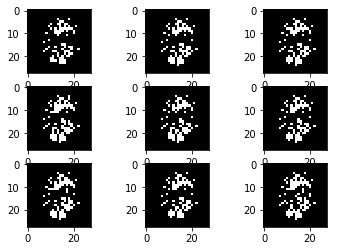

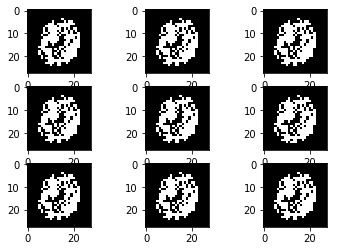

In [6]:
net.train(train_set, 100, 300, 0.002, 0.9, 0.002, 0.1, True)


In [7]:
net2 = CNN_GAN()


In [8]:
net2.train(train_set, 100, 300, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.0651237964630127
epoch 1 finished!
time usage: 2.0330822467803955
epoch 2 finished!
time usage: 2.031183958053589
epoch 3 finished!
time usage: 2.017981767654419
epoch 4 finished!
time usage: 2.014112710952759
epoch 5 finished!
time usage: 2.0273358821868896
epoch 6 finished!
time usage: 2.0351600646972656
epoch 7 finished!
time usage: 2.032160758972168
epoch 8 finished!
time usage: 2.158719778060913
epoch 9 finished!
time usage: 2.067312002182007
epoch 10 finished!
time usage: 2.050419330596924
epoch 11 finished!
time usage: 1.9845502376556396
epoch 12 finished!
time usage: 2.0722687244415283
epoch 13 finished!
time usage: 2.0861666202545166
epoch 14 finished!
time usage: 2.042595624923706
epoch 15 finished!
time usage: 1.9979476928710938
epoch 16 finished!
time usage: 2.016622304916382
epoch 17 finished!
time usage: 2.0187864303588867
epoch 18 finished!
time usage: 2.077730178833008
epoch 19 finished!
time usage: 2.0363454818725586


KeyboardInterrupt: 

In [9]:
net = Simple_GAN()


trainning on cuda:0
epoch 0 finished!
time usage: 2.127981185913086
epoch 1 finished!
time usage: 2.1015193462371826
epoch 2 finished!
time usage: 2.124964952468872
epoch 3 finished!
time usage: 2.0763139724731445
epoch 4 finished!
time usage: 2.1370551586151123
epoch 5 finished!
time usage: 2.167660713195801
epoch 6 finished!
time usage: 2.105004072189331
epoch 7 finished!
time usage: 2.1222376823425293
epoch 8 finished!
time usage: 2.1521270275115967
epoch 9 finished!
time usage: 2.121821403503418
epoch 10 finished!
time usage: 2.1422252655029297
epoch 11 finished!
time usage: 2.0789122581481934
epoch 12 finished!
time usage: 2.115678310394287
epoch 13 finished!
time usage: 2.1016244888305664
epoch 14 finished!
time usage: 2.1633102893829346
epoch 15 finished!
time usage: 2.140881061553955
epoch 16 finished!
time usage: 2.122673988342285
epoch 17 finished!
time usage: 2.0717837810516357
epoch 18 finished!
time usage: 2.136207103729248
epoch 19 finished!
time usage: 1.8823974132537842

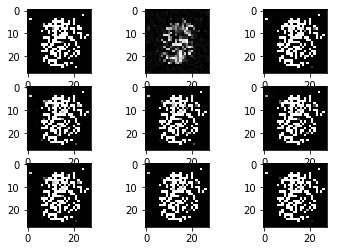

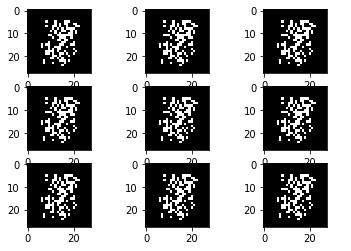

In [10]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


In [11]:
net2 = CNN_GAN()


trainning on cuda:0
epoch 0 finished!
time usage: 2.0500478744506836
epoch 1 finished!
time usage: 2.0730719566345215
epoch 2 finished!
time usage: 2.138556718826294
epoch 3 finished!
time usage: 2.0778303146362305
epoch 4 finished!
time usage: 2.1244640350341797
epoch 5 finished!
time usage: 2.0631563663482666
epoch 6 finished!
time usage: 2.073679208755493
epoch 7 finished!
time usage: 2.0852341651916504
epoch 8 finished!
time usage: 2.0562636852264404
epoch 9 finished!
time usage: 2.0519421100616455
epoch 10 finished!
time usage: 1.9122846126556396
epoch 11 finished!
time usage: 2.090390205383301
epoch 12 finished!
time usage: 2.03989839553833
epoch 13 finished!
time usage: 2.016808271408081
epoch 14 finished!
time usage: 2.0358693599700928
epoch 15 finished!
time usage: 2.061403512954712
epoch 16 finished!
time usage: 2.012646198272705
epoch 17 finished!
time usage: 1.94572114944458
epoch 18 finished!
time usage: 2.0113022327423096
epoch 19 finished!
time usage: 2.0031094551086426


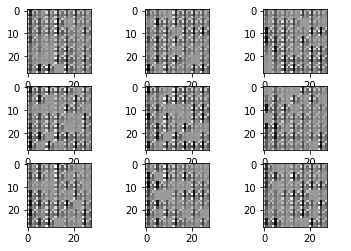

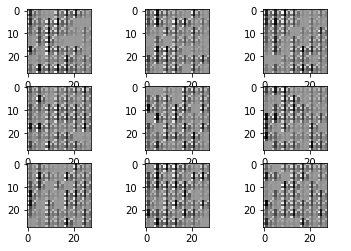

In [12]:
net2.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


In [13]:
net = Simple_GAN()


trainning on cuda:0
epoch 0 finished!
time usage: 2.163332223892212
epoch 1 finished!
time usage: 2.154888153076172
epoch 2 finished!
time usage: 2.119737386703491
epoch 3 finished!
time usage: 2.1856088638305664
epoch 4 finished!
time usage: 2.175318956375122
epoch 5 finished!
time usage: 2.133378267288208
epoch 6 finished!
time usage: 2.1539878845214844
epoch 7 finished!
time usage: 2.161530017852783
epoch 8 finished!
time usage: 2.1690480709075928
epoch 9 finished!
time usage: 2.079678535461426
epoch 10 finished!
time usage: 2.0836093425750732
epoch 11 finished!
time usage: 2.0932087898254395
epoch 12 finished!
time usage: 2.1239945888519287
epoch 13 finished!
time usage: 2.0978567600250244
epoch 14 finished!
time usage: 2.076960325241089
epoch 15 finished!
time usage: 2.076070547103882
epoch 16 finished!
time usage: 2.057647466659546
epoch 17 finished!
time usage: 2.1225271224975586
epoch 18 finished!
time usage: 2.0277762413024902
epoch 19 finished!
time usage: 2.1252222061157227


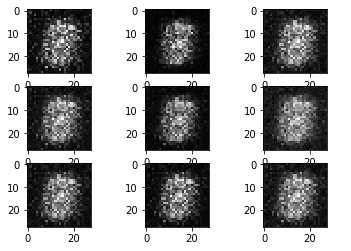

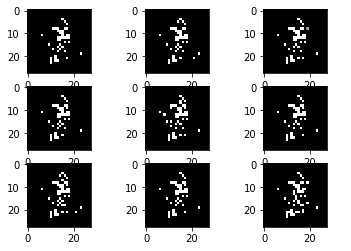

In [14]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.1211535930633545
epoch 1 finished!
time usage: 2.0457797050476074
epoch 2 finished!
time usage: 2.1112499237060547
epoch 3 finished!
time usage: 2.090792179107666
epoch 4 finished!
time usage: 2.049255847930908
epoch 5 finished!
time usage: 2.120885133743286
epoch 6 finished!
time usage: 2.103792428970337
epoch 7 finished!
time usage: 2.086087703704834
epoch 8 finished!
time usage: 2.087707757949829
epoch 9 finished!
time usage: 2.0985074043273926
epoch 10 finished!
time usage: 2.1016972064971924
epoch 11 finished!
time usage: 2.103571891784668
epoch 12 finished!
time usage: 2.098416805267334
epoch 13 finished!
time usage: 2.078476667404175
epoch 14 finished!
time usage: 2.0929081439971924
epoch 15 finished!
time usage: 2.0511534214019775
epoch 16 finished!
time usage: 2.153519630432129
epoch 17 finished!
time usage: 2.202470541000366
epoch 18 finished!
time usage: 2.1661341190338135
epoch 19 finished!
time usage: 2.085766315460205


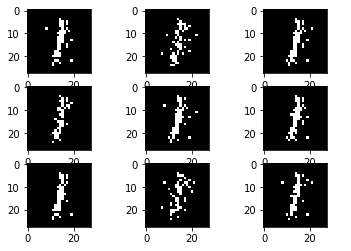

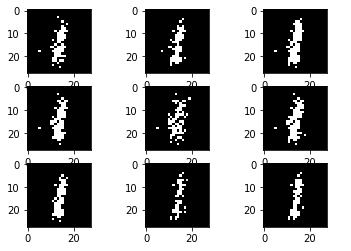

In [15]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


In [16]:
noise = net.noise(9).to(torch.device('cpu'))
with torch.no_grad():
    g_out = net.generator(noise)


In [17]:
print(g_out.size())


torch.Size([9, 784])


In [18]:
print(g_out)

tensor([[-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        ...,
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.]])


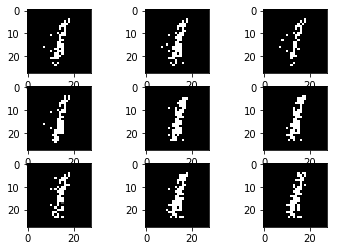

In [19]:
table_draw(g_out, 3, 3)

In [20]:
net.discriminator(g_out)

tensor([[-56.7539],
        [-39.9118],
        [-23.7579],
        [-11.8612],
        [-34.2654],
        [-69.6442],
        [-26.8559],
        [-41.5197],
        [-30.6650]], grad_fn=<AddmmBackward>)

In [21]:
net.discriminator(train_set[:10])

tensor([[-13.3300],
        [-12.6451],
        [ -3.4903],
        [-19.2914],
        [  5.1362],
        [ -6.8986],
        [ -2.4105],
        [ -1.4540],
        [ -8.9890],
        [ -1.4845]], grad_fn=<AddmmBackward>)

In [22]:
net.discriminator(train_set[:10] * 2 - 1)

tensor([[21.9106],
        [14.8222],
        [10.5698],
        [26.5285],
        [20.5979],
        [10.8797],
        [14.7247],
        [12.8103],
        [23.8823],
        [ 6.6865]], grad_fn=<AddmmBackward>)

trainning on cuda:0
epoch 0 finished!
time usage: 2.193713665008545
epoch 1 finished!
time usage: 2.139988660812378
epoch 2 finished!
time usage: 2.194783926010132
epoch 3 finished!
time usage: 2.133086681365967
epoch 4 finished!
time usage: 2.184406280517578
epoch 5 finished!
time usage: 2.134545087814331
epoch 6 finished!
time usage: 2.135456085205078
epoch 7 finished!
time usage: 2.0705928802490234
epoch 8 finished!
time usage: 2.100818157196045
epoch 9 finished!
time usage: 2.1474015712738037
epoch 10 finished!
time usage: 2.097323417663574
epoch 11 finished!
time usage: 2.0813093185424805
epoch 12 finished!
time usage: 2.105560302734375
epoch 13 finished!
time usage: 2.14530873298645
epoch 14 finished!
time usage: 2.1812500953674316
epoch 15 finished!
time usage: 2.0682060718536377
epoch 16 finished!
time usage: 2.165470600128174
epoch 17 finished!
time usage: 2.085482597351074
epoch 18 finished!
time usage: 2.13788104057312
epoch 19 finished!
time usage: 2.051377534866333


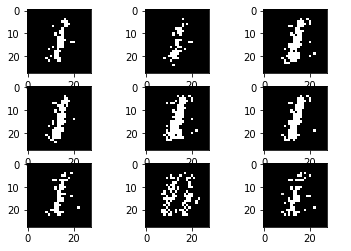

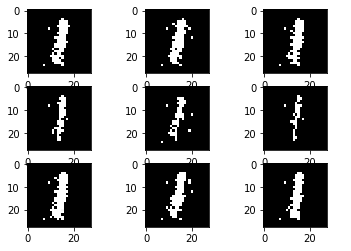

In [23]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.180544853210449
epoch 1 finished!
time usage: 2.0955686569213867
epoch 2 finished!
time usage: 2.034266471862793
epoch 3 finished!
time usage: 2.108924150466919
epoch 4 finished!
time usage: 2.086696147918701
epoch 5 finished!
time usage: 2.1252870559692383
epoch 6 finished!
time usage: 2.114170551300049
epoch 7 finished!
time usage: 2.111696481704712
epoch 8 finished!
time usage: 2.076530933380127
epoch 9 finished!
time usage: 2.140199899673462
epoch 10 finished!
time usage: 2.107090711593628
epoch 11 finished!
time usage: 2.127878427505493
epoch 12 finished!
time usage: 2.1573219299316406
epoch 13 finished!
time usage: 2.0467519760131836
epoch 14 finished!
time usage: 2.1302289962768555
epoch 15 finished!
time usage: 2.1145308017730713
epoch 16 finished!
time usage: 2.166914939880371
epoch 17 finished!
time usage: 2.1054420471191406
epoch 18 finished!
time usage: 2.1636931896209717
epoch 19 finished!
time usage: 2.1042046546936035


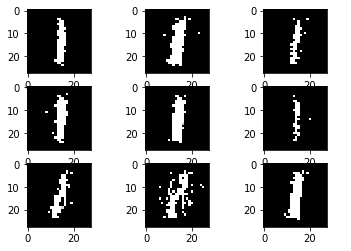

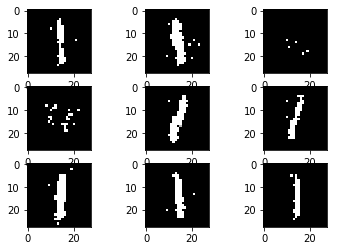

In [24]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.0567140579223633
epoch 1 finished!
time usage: 2.1064529418945312
epoch 2 finished!
time usage: 2.1290435791015625
epoch 3 finished!
time usage: 2.1056296825408936
epoch 4 finished!
time usage: 2.052232503890991
epoch 5 finished!
time usage: 2.0838797092437744
epoch 6 finished!
time usage: 2.0911436080932617
epoch 7 finished!
time usage: 1.9159936904907227
epoch 8 finished!
time usage: 1.9580419063568115
epoch 9 finished!
time usage: 1.9196162223815918
epoch 10 finished!
time usage: 2.0424554347991943
epoch 11 finished!
time usage: 2.0085811614990234
epoch 12 finished!
time usage: 2.1529738903045654
epoch 13 finished!
time usage: 2.131679058074951
epoch 14 finished!
time usage: 2.132073163986206
epoch 15 finished!
time usage: 2.2363736629486084
epoch 16 finished!
time usage: 2.2181622982025146
epoch 17 finished!
time usage: 2.1479105949401855
epoch 18 finished!
time usage: 2.186190605163574
epoch 19 finished!
time usage: 2.10616612434

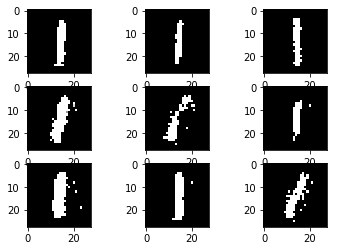

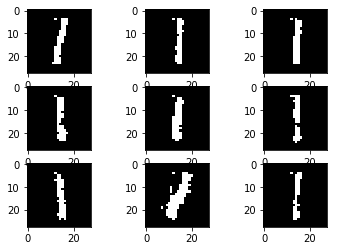

In [25]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


In [26]:
net.parameters()

<generator object Module.parameters at 0x7f3ba1a4f1d0>

In [27]:
net.parameters

<bound method Module.parameters of Simple_GAN(
  (generator): Simple_Generator(
    (fc1): Linear(in_features=100, out_features=32, bias=True)
    (fc2): Linear(in_features=32, out_features=64, bias=True)
    (fc3): Linear(in_features=64, out_features=128, bias=True)
    (fc4): Linear(in_features=128, out_features=784, bias=True)
    (dropout): Dropout(p=0.3, inplace=False)
    (criterion): BCEWithLogitsLoss()
  )
  (discriminator): Simple_Discriminator(
    (fc1): Linear(in_features=784, out_features=128, bias=True)
    (fc2): Linear(in_features=128, out_features=64, bias=True)
    (fc3): Linear(in_features=64, out_features=32, bias=True)
    (fc4): Linear(in_features=32, out_features=1, bias=True)
    (dropout): Dropout(p=0.3, inplace=False)
    (criterion): BCEWithLogitsLoss()
  )
)>

In [28]:
noise = net.noise(9).to(torch.device('cpu'))
with torch.no_grad():
    g_out = net.generator(noise)


In [29]:
print(g_out.size())


torch.Size([9, 784])


In [30]:
print(g_out)

tensor([[-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        ...,
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.]])


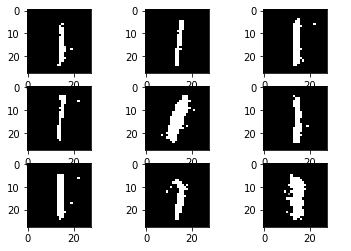

In [31]:
table_draw(g_out, 3, 3)

In [32]:
net.discriminator(g_out)

tensor([[-20.4102],
        [ -9.8924],
        [ -7.2790],
        [ -6.4693],
        [-15.5185],
        [ -7.5872],
        [-12.6709],
        [ -2.7511],
        [-12.4510]], grad_fn=<AddmmBackward>)

In [33]:
net.discriminator(train_set[:10] * 2 - 1)

tensor([[27.7614],
        [31.3859],
        [ 5.7232],
        [ 9.1415],
        [13.1746],
        [ 4.1084],
        [ 5.3332],
        [21.0737],
        [ 5.1763],
        [ 5.7694]], grad_fn=<AddmmBackward>)

trainning on cuda:0
epoch 0 finished!
time usage: 2.228034496307373
epoch 1 finished!
time usage: 2.079852819442749
epoch 2 finished!
time usage: 2.2038097381591797
epoch 3 finished!
time usage: 2.086088180541992
epoch 4 finished!
time usage: 2.0746400356292725
epoch 5 finished!
time usage: 2.1661767959594727
epoch 6 finished!
time usage: 1.985891342163086
epoch 7 finished!
time usage: 2.1201672554016113
epoch 8 finished!
time usage: 2.0738396644592285
epoch 9 finished!
time usage: 2.018453359603882
epoch 10 finished!
time usage: 1.9410250186920166
epoch 11 finished!
time usage: 2.120900869369507
epoch 12 finished!
time usage: 2.173311471939087
epoch 13 finished!
time usage: 2.1305904388427734
epoch 14 finished!
time usage: 2.111715793609619
epoch 15 finished!
time usage: 2.1255335807800293
epoch 16 finished!
time usage: 2.0969889163970947
epoch 17 finished!
time usage: 2.2416651248931885
epoch 18 finished!
time usage: 2.1411516666412354
epoch 19 finished!
time usage: 2.092942714691162

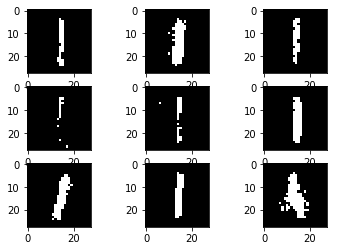

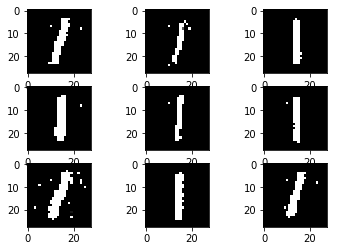

In [34]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


In [35]:
noise = net.noise(9).to(torch.device('cpu'))
with torch.no_grad():
    g_out = net.generator(noise)


In [36]:
print(g_out.size())


torch.Size([9, 784])


In [37]:
print(g_out)

tensor([[-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        ...,
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.]])


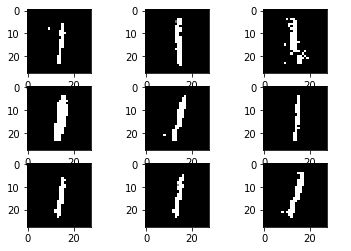

In [38]:
table_draw(g_out, 3, 3)

In [39]:
net.discriminator(g_out)

tensor([[-14.2807],
        [-21.0008],
        [-40.8713],
        [ -7.9816],
        [-11.0917],
        [-16.7521],
        [-15.7653],
        [-15.4470],
        [-32.3965]], grad_fn=<AddmmBackward>)

In [40]:
net.discriminator(train_set[:10] * 2 - 1)

tensor([[22.4957],
        [30.0253],
        [ 9.2180],
        [ 5.1359],
        [34.6172],
        [ 9.3696],
        [ 0.6551],
        [17.5264],
        [ 2.1383],
        [11.7477]], grad_fn=<AddmmBackward>)

trainning on cuda:0
epoch 0 finished!
time usage: 2.0486879348754883
epoch 1 finished!
time usage: 2.031989812850952
epoch 2 finished!
time usage: 2.0167059898376465
epoch 3 finished!
time usage: 2.0845558643341064
epoch 4 finished!
time usage: 2.0273563861846924
epoch 5 finished!
time usage: 2.0035812854766846
epoch 6 finished!
time usage: 2.025916337966919
epoch 7 finished!
time usage: 2.08933162689209
epoch 8 finished!
time usage: 2.023102045059204
epoch 9 finished!
time usage: 1.9826862812042236
epoch 10 finished!
time usage: 2.1478254795074463
epoch 11 finished!
time usage: 2.087876558303833
epoch 12 finished!
time usage: 1.9070777893066406
epoch 13 finished!
time usage: 2.08016037940979
epoch 14 finished!
time usage: 1.9925436973571777
epoch 15 finished!
time usage: 2.065392255783081
epoch 16 finished!
time usage: 1.8693153858184814
epoch 17 finished!
time usage: 1.9595947265625
epoch 18 finished!
time usage: 2.126697540283203
epoch 19 finished!
time usage: 2.121077299118042


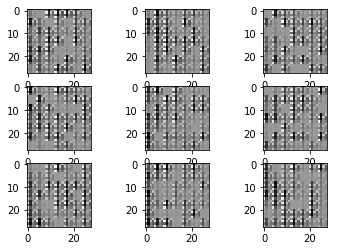

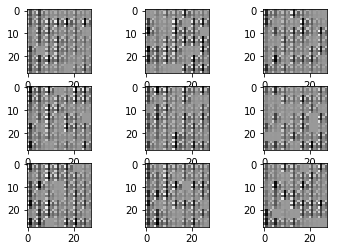

In [41]:
net2.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.07444167137146
epoch 1 finished!
time usage: 2.1565589904785156
epoch 2 finished!
time usage: 2.1482694149017334
epoch 3 finished!
time usage: 2.1458659172058105
epoch 4 finished!
time usage: 2.1799447536468506
epoch 5 finished!
time usage: 2.1830828189849854
epoch 6 finished!
time usage: 2.0255632400512695
epoch 7 finished!
time usage: 2.1258950233459473
epoch 8 finished!
time usage: 2.229125499725342
epoch 9 finished!
time usage: 2.1696019172668457
epoch 10 finished!
time usage: 2.2131857872009277
epoch 11 finished!
time usage: 2.0517172813415527
epoch 12 finished!
time usage: 2.153507947921753
epoch 13 finished!
time usage: 2.1672379970550537
epoch 14 finished!
time usage: 2.096872329711914
epoch 15 finished!
time usage: 2.100416660308838
epoch 16 finished!
time usage: 2.095860719680786
epoch 17 finished!
time usage: 2.182436466217041
epoch 18 finished!
time usage: 2.153427839279175
epoch 19 finished!
time usage: 2.169132709503174


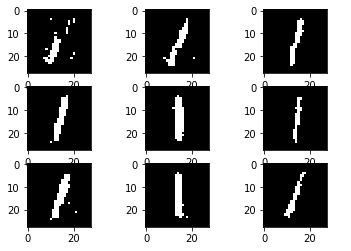

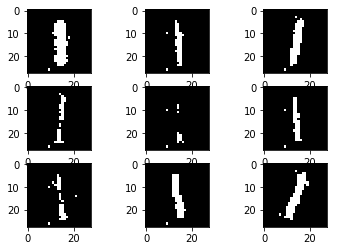

In [42]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


In [43]:
noise = net.noise(9).to(torch.device('cpu'))
with torch.no_grad():
    g_out = net.generator(noise)


In [44]:
print(g_out.size())


torch.Size([9, 784])


In [45]:
print(g_out)

tensor([[-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        ...,
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.]])


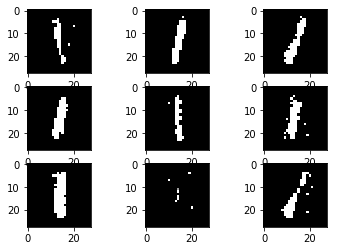

In [46]:
table_draw(g_out, 3, 3)

In [47]:
net.discriminator(g_out)

tensor([[-28.1980],
        [ -4.7522],
        [-45.8165],
        [-26.0053],
        [-20.9927],
        [-48.5842],
        [-18.3579],
        [-23.4380],
        [-22.7743]], grad_fn=<AddmmBackward>)

In [48]:
net.discriminator(train_set[:10] * 2 - 1)

tensor([[12.1999],
        [18.4907],
        [ 7.0715],
        [ 5.3808],
        [24.0891],
        [13.9515],
        [ 2.9606],
        [35.2535],
        [ 0.4205],
        [ 4.9859]], grad_fn=<AddmmBackward>)

In [49]:
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch
from torch import optim
import random
import time
from utils import load_1d_data
from utils import load_2d_data
from utils import draw
from utils import table_draw


In [50]:
class Simple_Generator(nn.Module):
    def __init__(self):
        super(Simple_Generator, self).__init__()
        
        # define hidden linear layers
        self.fc1 = nn.Linear(100, 32)
        self.fc2 = nn.Linear(32, 64)
        self.fc3 = nn.Linear(64, 128)
        
        # final fully-connected layer
        self.fc4 = nn.Linear(128, 28 * 28)
        
        # dropout layer
        self.dropout = nn.Dropout(0.3)

        self.criterion = nn.BCEWithLogitsLoss()

        return

    def forward(self, x):
        # all hidden layers
        x = F.leaky_relu(self.fc1(x), 0.2)  # (input, negative_slope=0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = self.dropout(x)
        # final layer with tanh applied
        out = F.tanh(self.fc4(x))

        return out

class Simple_Discriminator(nn.Module):
    def __init__(self):
        super(Simple_Discriminator, self).__init__()
        
        # define hidden linear layers
        self.fc1 = nn.Linear(784, 32 * 4)
        self.fc2 = nn.Linear(32 * 4, 32 * 2)
        self.fc3 = nn.Linear(32 * 2, 32)
        
        # final fully-connected layer
        self.fc4 = nn.Linear(32, 1)
        
        # dropout layer
        self.dropout = nn.Dropout(0.3)

        self.criterion = nn.BCEWithLogitsLoss()

        return
        
    def forward(self, x):
        # flatten image
        x = x.view(-1, 28 * 28)
        # all hidden layers
        x = F.leaky_relu(self.fc1(x), 0.2)  # (input, negative_slope=0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = self.dropout(x)
        # final layer
        out = self.fc4(x)

        return out

class Simple_GAN(nn.Module):
    def __init__(self):
        super(Simple_GAN, self).__init__()
        self.generator = Simple_Generator()
        self.discriminator = Simple_Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 100, device=(self.device)) * 2 - 1

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.reshape(-1, 28 * 28).to(self.device) * 2 - 1
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, 1), torch.ones(batch_size, 1)), 0)
        labels = labels.to(self.device)
        fake_labels = torch.ones(batch_size, 1).to(self.device)

        g_optimizer = optim.Adam(self.generator.parameters(), lr=g_eta)
        d_optimizer = optim.Adam(self.discriminator.parameters(), lr=d_eta)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.generator.criterion(d_out, fake_labels)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices].squeeze()
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))



In [51]:
class CNN_Generator(nn.Module):
    def __init__(self):
        super(CNN_Generator, self).__init__()
        # The decoder
        self.t_conv1 = nn.ConvTranspose2d(1, 16, 2, stride=2, bias=False)
        # self.bn1 = nn.BatchNorm2d(16)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2, bias=False)
        # self.bn2 = nn.BatchNorm2d(1)

        return

    def forward(self, x):
        x = F.leaky_relu(self.t_conv1(x))
        x = F.sigmoid(self.t_conv2(x))

        return x

class CNN_Discriminator(nn.Module):
    def __init__(self):
        super(CNN_Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(1, 64, 3, stride=(3, 3))
        # self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 16, 3, stride=(3, 3))
        # self.bn2 = nn.BatchNorm2d(16)

        # self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(16 * 3 * 3, 120)
        self.fc2 = nn.Linear(120, 32)
        self.fc3 = nn.Linear(32, 1)

        # self.sm = nn.Softmax()

        # self.criterion = nn.NLLLoss()
        self.criterion = nn.BCELoss()

        return

    def forward(self, x):
        # Let the net to learn pool function
        # x = self.pool(F.leaky_relu(self.conv1(x)))

        # x = self.pool(F.leaky_relu(self.conv2(x)))

        x = x.reshape(-1, 1, 28, 28)

        x = F.leaky_relu(self.conv1(x))
        # x = F.leaky_relu(x)
        x = F.leaky_relu(self.conv2(x))
        # x = F.leaky_relu(x)

        x = x.view(-1, self.num_flat_features(x))   # -1 represents the batch dimension
        x = F.leaky_relu(self.fc1(x))
        x = F.leaky_relu(self.fc2(x))
        x = F.sigmoid(self.fc3(x))
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

class CNN_GAN(nn.Module):
    def __init__(self):
        super(CNN_GAN, self).__init__()
        self.generator = CNN_Generator()
        self.discriminator = CNN_Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 1, 7, 7, device=(self.device))

    def g_loss(self, d_out):
        loss = torch.mean(torch.log(1 - d_out))

        return loss

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.to(self.device)
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, 1), torch.ones(batch_size, 1)), 0)
        labels = labels.to(self.device)
        fake_labels = torch.ones(batch_size, 1).to(self.device)

        g_optimizer = optim.Adam(self.generator.parameters(), lr=g_eta)
        d_optimizer = optim.Adam(self.discriminator.parameters(), lr=d_eta)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.g_loss(d_out)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices]
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True and epoch % 10 == 0:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))


In [52]:
noise = net.noise(9).to(torch.device('cpu'))
with torch.no_grad():
    g_out = net.generator(noise)


In [53]:
print(g_out.size())


torch.Size([9, 784])


In [54]:
print(g_out)

tensor([[-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        ...,
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.],
        [-1., -1., -1.,  ..., -1., -1., -1.]])


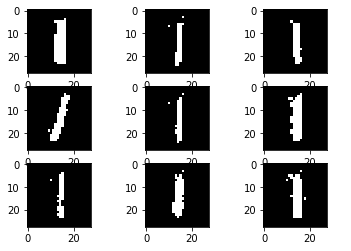

In [55]:
table_draw(g_out, 3, 3)

In [56]:
net = Simple_GAN()


In [57]:
noise = net.noise(9).to(torch.device('cpu'))
with torch.no_grad():
    g_out = net.generator(noise)


In [58]:
print(g_out.size())


torch.Size([9, 784])


In [59]:
print(g_out)

tensor([[-0.0916,  0.0888, -0.0312,  ...,  0.0133, -0.0591,  0.0895],
        [-0.1536,  0.0750, -0.0067,  ..., -0.0108, -0.0140,  0.0760],
        [-0.1405,  0.0621,  0.0219,  ..., -0.0069, -0.0819,  0.0472],
        ...,
        [-0.1856,  0.0290,  0.0550,  ..., -0.0361, -0.0614,  0.0586],
        [-0.0901,  0.1638,  0.0019,  ...,  0.0153,  0.0310,  0.0047],
        [-0.1399,  0.0344, -0.0198,  ..., -0.0190,  0.0469,  0.0260]])


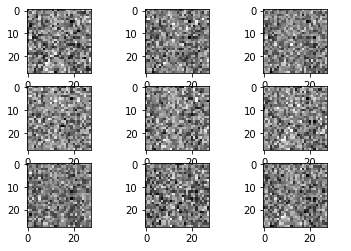

In [60]:
table_draw(g_out, 3, 3)

trainning on cuda:0
epoch 0 finished!
time usage: 2.191446542739868
epoch 1 finished!
time usage: 2.1267268657684326
epoch 2 finished!
time usage: 2.148923397064209
epoch 3 finished!
time usage: 2.0783982276916504
epoch 4 finished!
time usage: 2.117039203643799
epoch 5 finished!
time usage: 2.1634693145751953
epoch 6 finished!
time usage: 2.1147422790527344
epoch 7 finished!
time usage: 2.1133475303649902
epoch 8 finished!
time usage: 2.1192188262939453
epoch 9 finished!
time usage: 2.0915937423706055
epoch 10 finished!
time usage: 2.116068124771118
epoch 11 finished!
time usage: 2.1073243618011475
epoch 12 finished!
time usage: 2.0969479084014893
epoch 13 finished!
time usage: 2.0838403701782227
epoch 14 finished!
time usage: 2.118776798248291
epoch 15 finished!
time usage: 2.11594295501709
epoch 16 finished!
time usage: 2.130002021789551
epoch 17 finished!
time usage: 2.0701377391815186
epoch 18 finished!
time usage: 2.079233169555664
epoch 19 finished!
time usage: 2.159287929534912


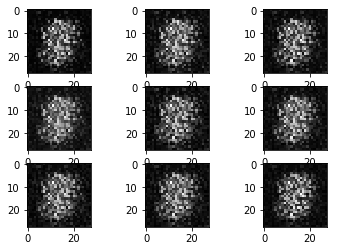

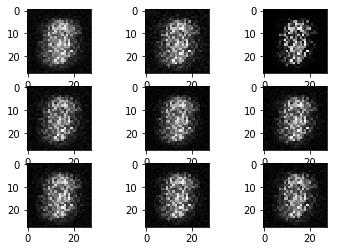

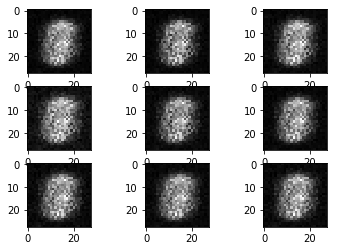

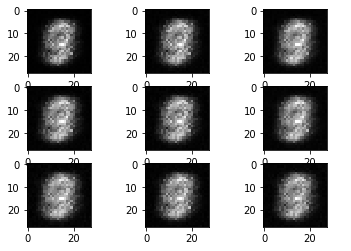

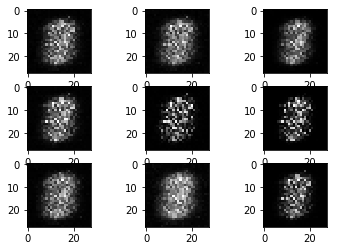

...

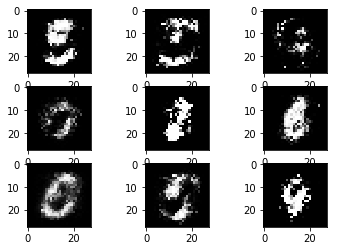

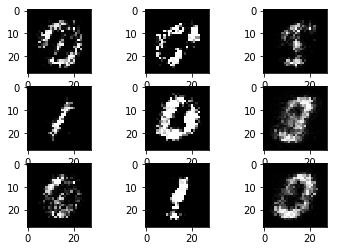

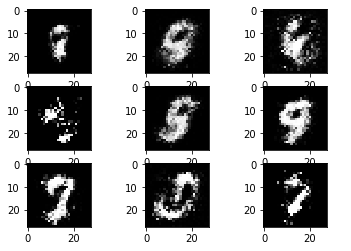

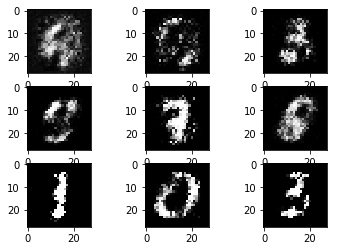

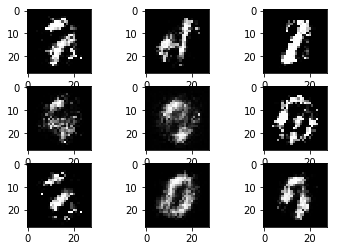

In [61]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.1427977085113525
epoch 1 finished!
time usage: 2.107025623321533
epoch 2 finished!
time usage: 2.1251380443573
epoch 3 finished!
time usage: 2.071627378463745
epoch 4 finished!
time usage: 2.0770936012268066
epoch 5 finished!
time usage: 2.180806875228882
epoch 6 finished!
time usage: 2.112783908843994
epoch 7 finished!
time usage: 2.017284631729126
epoch 8 finished!
time usage: 2.0834362506866455
epoch 9 finished!
time usage: 2.1500439643859863
epoch 10 finished!
time usage: 2.0608601570129395
epoch 11 finished!
time usage: 2.1421256065368652
epoch 12 finished!
time usage: 2.1038527488708496
epoch 13 finished!
time usage: 2.1129510402679443
epoch 14 finished!
time usage: 2.1009023189544678
epoch 15 finished!
time usage: 2.0916991233825684
epoch 16 finished!
time usage: 2.093078136444092
epoch 17 finished!
time usage: 1.9690494537353516
epoch 18 finished!
time usage: 1.891507625579834
epoch 19 finished!
time usage: 2.190002202987671


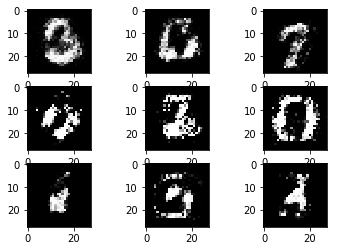

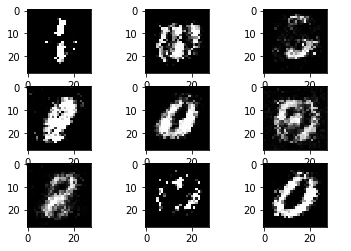

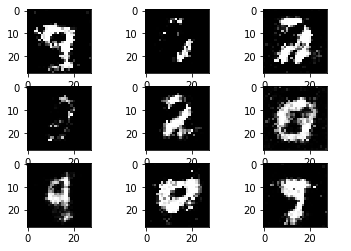

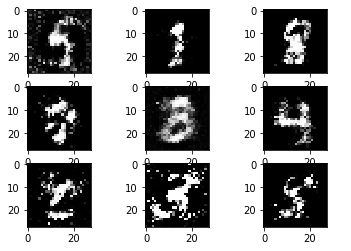

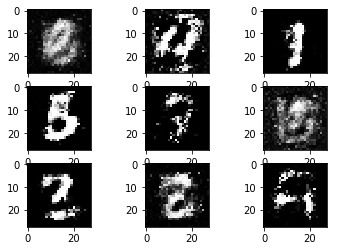

...

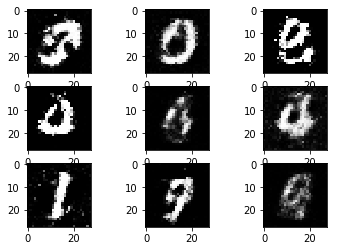

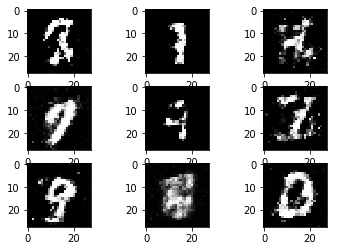

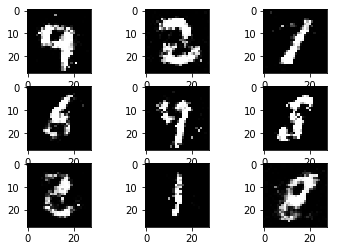

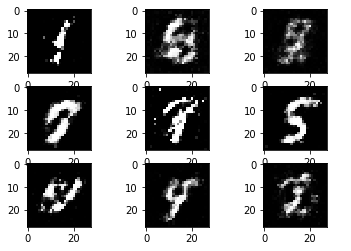

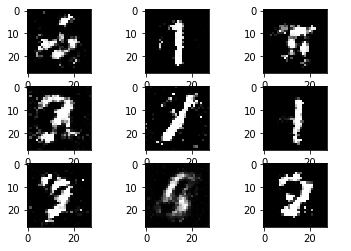

In [62]:
net.train(train_set, 100, 20, 0.002, 0.9, 0.002, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 2.1636111736297607
epoch 1 finished!
time usage: 2.1462855339050293
epoch 2 finished!
time usage: 2.0633504390716553
epoch 3 finished!
time usage: 2.154700517654419
epoch 4 finished!
time usage: 2.1412439346313477
epoch 5 finished!
time usage: 2.0527284145355225
epoch 6 finished!
time usage: 2.0962796211242676
epoch 7 finished!
time usage: 2.1285016536712646
epoch 8 finished!
time usage: 2.1871418952941895
epoch 9 finished!
time usage: 2.021916627883911
epoch 10 finished!
time usage: 2.178257703781128
epoch 11 finished!
time usage: 2.09911847114563
epoch 12 finished!
time usage: 2.1167120933532715
epoch 13 finished!
time usage: 2.0796639919281006
epoch 14 finished!
time usage: 2.114715576171875
epoch 15 finished!
time usage: 2.15790057182312
epoch 16 finished!
time usage: 2.0885508060455322
epoch 17 finished!
time usage: 2.1204094886779785
epoch 18 finished!
time usage: 2.106829881668091
epoch 19 finished!
time usage: 2.095808744430542


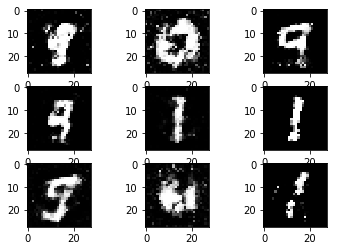

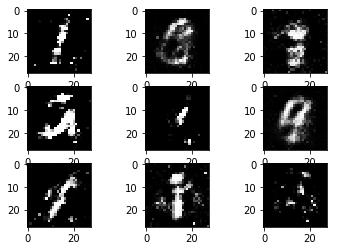

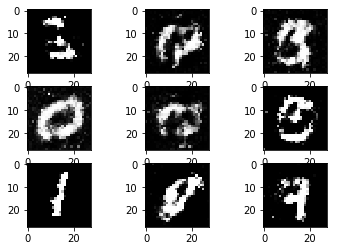

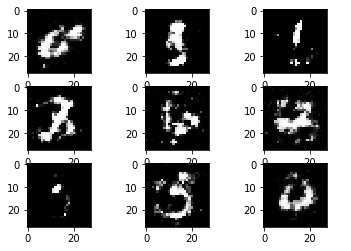

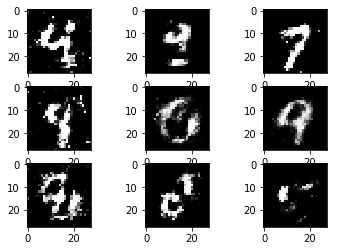

...

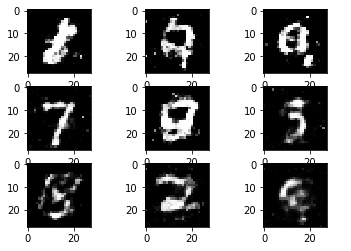

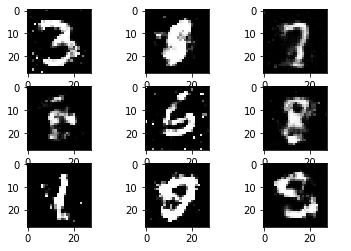

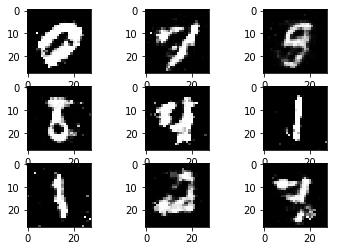

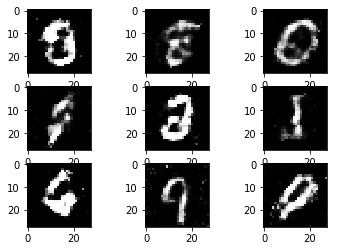

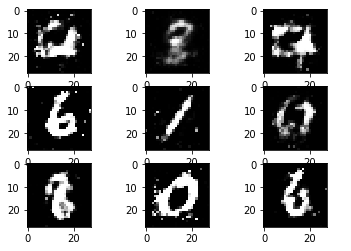

In [63]:
net.train(train_set, 100, 200, 0.002, 0.9, 0.002, 0.1, True)
